In [1]:
import numpy as np
%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib
matplotlib.style.use('ggplot')
import pandas as pd

#import lsst.ip.diffim as ipDiffim
# I linked from ip_diffim/python/lsst/ip/diffim/imageMapReduce.py into diffimTests/imageMapReduce.py
#    (or copy it)

In [2]:
import diffimTests as dit
#reload(dit)

n_sources = 600

testObj = dit.DiffimTest(varFlux2=np.repeat(620*np.sqrt(2)*2., 10),  #5000, 10), #
                         n_sources=n_sources, verbose=True, sourceFluxRange=(2000., 120000.), 
                         #psf_yvary_factor=0., psfSize=13)
                         psf_yvary_factor=0.5, psfSize=13)
res = testObj.runTest(spatialKernelOrder=2, zogyImageSpace=False)
print res

Template PSF: [1.6, 1.6] 0.0
Science PSF: [1.8, 2.2] -45.0
0.824621125124
Offset: [0.0, 0.0]
PSF y spatial-variation: -0.492813481453 0.493450410102
Variable source: 9 368.142255845 52.2977464926 0 1753.62481734
Variable source: 3 437.677528631 394.051374239 0 1753.62481734
Variable source: 7 77.2355874401 392.237254371 0 1753.62481734
Variable source: 4 466.336488467 328.755746086 0 1753.62481734
Variable source: 10 66.5809759253 363.20308398 0 1753.62481734
Variable source: 6 352.24315562 433.633351478 0 1753.62481734
Variable source: 1 237.897633976 429.430670374 0 1753.62481734
Variable source: 2 260.515557753 389.705213876 0 1753.62481734
Variable source: 8 184.879430277 305.582257912 0 1753.62481734
Variable source: 0 300.731568916 220.088731954 0 1753.62481734
{'Zogy': {'FP': 38, 'FN': 3, 'TP': 7}, 'ALstack': {'FP': 5, 'FN': 0, 'TP': 10}, 'SZogy': {'FP': 30, 'FN': 0, 'TP': 10}, 'ALstack_decorr': {'FP': 1, 'FN': 1, 'TP': 9}}


A&L(dec): stats(mean=0.07930059, stdev=24.747385, min=-217.34805, max=220.93216)
Zogy: stats(mean=-0.040037370931139633, stdev=24.965562623012925, min=-926.53740414887511, max=1053.4874267800274)
A&L(dec) - Zogy: stats(mean=-0.011946324040995118, stdev=2.6281261599274095, min=-872.07162808954024, max=916.78279140508312)
A&L(dec) - A&L: stats(mean=-0.024965078, stdev=6.9027791, min=-60.441925, max=55.486847)
Scorr: stats(mean=3.1056393014787563e-06, stdev=0.00026775075627154764, min=-0.017524996304398684, max=0.016133159269178528)
Scorr_var: stats(mean=0.00025203141787985339, stdev=1.495047637303307e-06, min=0.0002466211009686534, max=0.0012317373972307024)


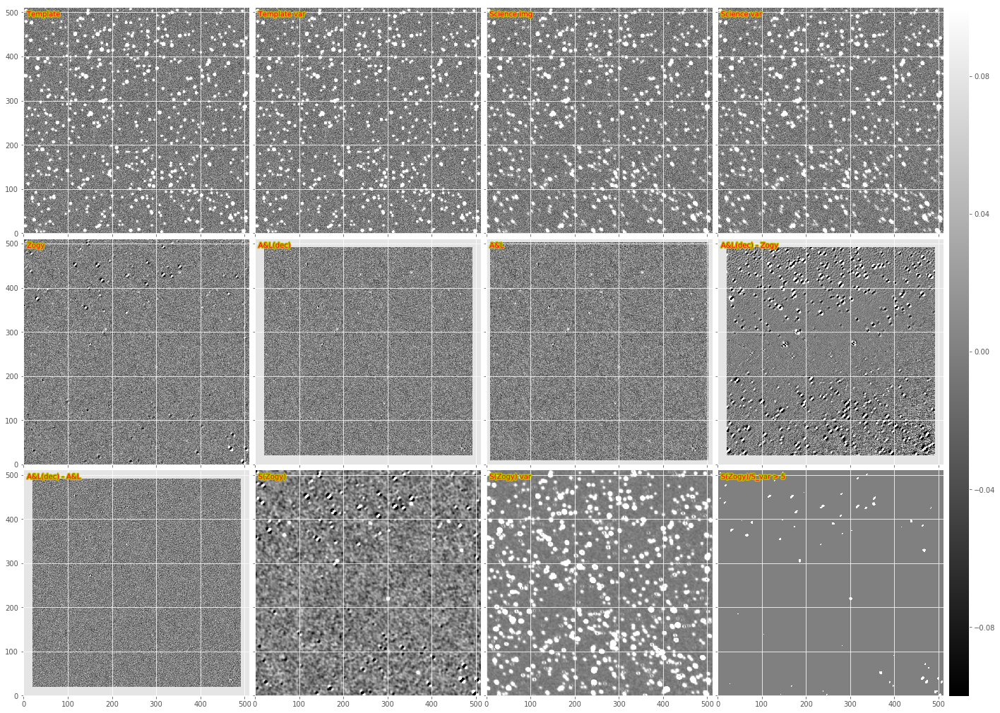

In [3]:
exposure = testObj.im2.asAfwExposure()
template = testObj.im1.asAfwExposure()

testObj.doPlot(imScale=6, include_Szogy=True);

Template PSF: [1.6, 1.6] 0.0
Science PSF: [1.8, 2.2] -45.0
0.824621125124
Offset: [0.0, 0.0]
PSF y spatial-variation: -0.492813481453 0.493450410102
Variable source: 9 368.142255845 52.2977464926 0 1753.62481734
Variable source: 3 437.677528631 394.051374239 0 1753.62481734
Variable source: 7 77.2355874401 392.237254371 0 1753.62481734
Variable source: 4 466.336488467 328.755746086 0 1753.62481734
Variable source: 10 66.5809759253 363.20308398 0 1753.62481734
Variable source: 6 352.24315562 433.633351478 0 1753.62481734
Variable source: 1 237.897633976 429.430670374 0 1753.62481734
Variable source: 2 260.515557753 389.705213876 0 1753.62481734
Variable source: 8 184.879430277 305.582257912 0 1753.62481734
Variable source: 0 300.731568916 220.088731954 0 1753.62481734
{'Zogy': {'FP': 31, 'FN': 3, 'TP': 7}, 'ALstack': {'FP': 5, 'FN': 0, 'TP': 10}, 'SZogy': {'FP': 15, 'FN': 0, 'TP': 10}, 'ALstack_decorr': {'FP': 1, 'FN': 1, 'TP': 9}}
A&L(dec): stats(mean=0.07930059, stdev=24.747385, min=-

diffimTests/diffimTests.py:106: RuntimeWarning: invalid value encountered in greater
  imagesToPlot.append((self.S_Zogy.im / self.S_Zogy.var > 5.) * 10.0)


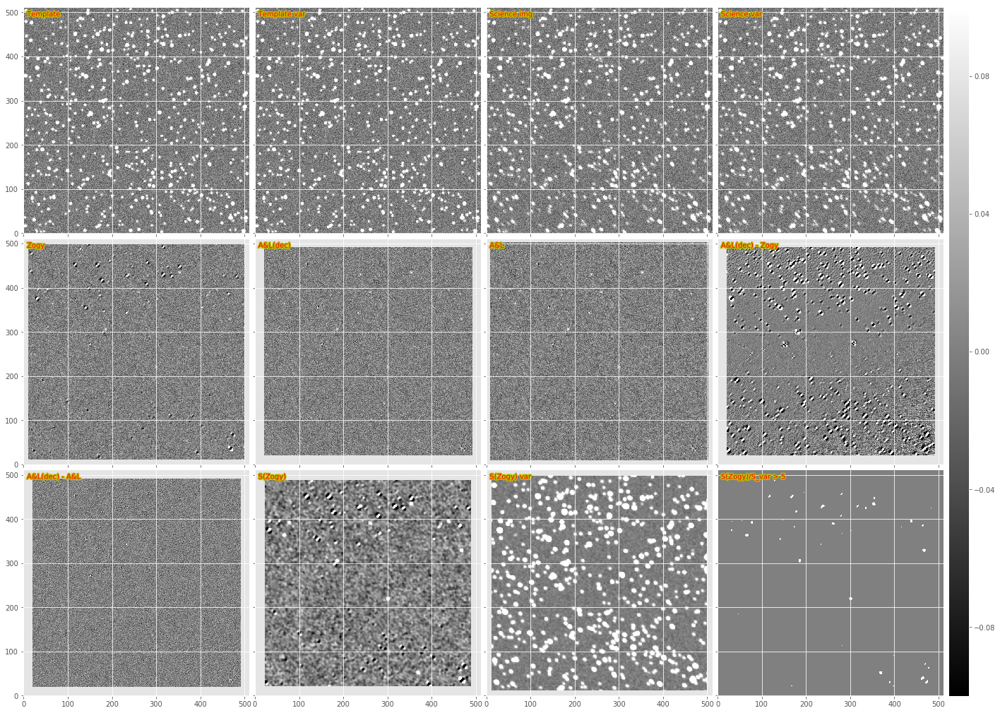

In [4]:
testObj2 = dit.DiffimTest(varFlux2=np.repeat(620*np.sqrt(2)*2., 10),
                         n_sources=n_sources, verbose=True, sourceFluxRange=(2000., 120000.), 
                         #psf_yvary_factor=0., psfSize=13)
                         psf_yvary_factor=0.5, psfSize=13)
res2 = testObj2.runTest(spatialKernelOrder=2, zogyImageSpace=True)
print res2
testObj2.doPlot(imScale=6, include_Szogy=True);

In [5]:
import lsst.pex.config as pexConfig
import lsst.afw.image as afwImage
import lsst.afw.geom as afwGeom
import lsst.pipe.base as pipeBase

class ZogyMapperSubtask(dit.ImageMapperSubtask):
    ConfigClass = dit.ImageMapperSubtaskConfig
    _DefaultName = 'diffimTests_ZogyMapperSubtask'
    
    def __init__(self, *args, **kwargs):
        dit.ImageMapperSubtask.__init__(self, *args, **kwargs)
        
    def run(self, subExp, expandedSubExp, fullBBox, **kwargs):
        bbox = subExp.getBBox()
        center = ((bbox.getBeginX() + bbox.getEndX()) // 2., (bbox.getBeginY() + bbox.getEndY()) // 2.)
        center = afwGeom.Point2D(center[0], center[1])
        
        variablePsf2 = kwargs.get('variablePsf', None)
        sigmas = kwargs.get('sigmas', None)
        imageSpace = kwargs.get('inImageSpace', False)
        doScorr = kwargs.get('Scorr', False)
                
        # Psf and image for science img (index 2)
        subExp2 = subExp
        if variablePsf2 is None:
            psf2 = subExp.getPsf().computeImage(center).getArray()
            #print 'HERE:', center.getX(), center.getY(), subExp.getPsf().computeShape(center).getDeterminantRadius()
        else:
            psf2 = variablePsf2.getImage(center.getX(), center.getY())
        psf2_orig = psf2
        subim2 = expandedSubExp.getMaskedImage()
        subarr2 = subim2.getImage().getArray()
        subvar2 = subim2.getVariance().getArray()
        if sigmas is None:
            sig2 = np.sqrt(dit.computeClippedImageStats(subvar2).mean)
        else:
            sig2 = sigmas[1]  # for testing, can use the input sigma (global value for entire exposure)
        
        # Psf and image for template img (index 1)
        template = kwargs.get('template')
        subExp1 = afwImage.ExposureF(template, expandedSubExp.getBBox())
        psf1 = template.getPsf().computeImage(center).getArray()
        psf1_orig = psf1
        subim1 = subExp1.getMaskedImage()
        subarr1 = subim1.getImage().getArray()
        subvar1 = subim1.getVariance().getArray()
        if sigmas is None:
            sig1 = np.sqrt(dit.computeClippedImageStats(subvar1).mean)
        else:
            sig1 = sigmas[0]
        
        #shape2 = subExp2.getPsf().computeShape(afwGeom.Point2D(center[0], center[1]))
        #shape1 = subExp1.getPsf().computeShape(afwGeom.Point2D(center[0], center[1]))
        #print shape2, shape1
        
        psf1b = psf1; psf2b = psf2
        if True and psf1.shape[0] == 41:   # it's a measured psf (hack!) Note this *really* helps for measured psfs.
            psf1b = psf1.copy()
            psf1b[psf1b < 0] = 0
            #psf1b[0:10,0:10] = psf1b[31:41,31:41] = 0
            psf1b[0:10,:] = psf1b[:,0:10] = psf1b[31:41,:] = psf1b[:,31:41] = 0
            psf1b /= psf1b.sum()

            psf2b = psf2.copy()
            psf2b[psf2b < 0] = 0
            psf2b[0:10,:] = psf2b[:,0:10] = psf2b[31:41,:] = psf2b[:,31:41] = 0
            psf2b /= psf2b.sum()

        # from diffimTests.diffimTests ...
        if subarr1.shape[0] < psf1.shape[0] or subarr1.shape[1] < psf1.shape[1]:
            return pipeBase.Struct(subExposure=subExp)

        tmpExp = expandedSubExp.clone()
        tmpIM = tmpExp.getMaskedImage()

        if not doScorr:
            D_zogy, var_zogy = dit.zogy.computeZogy(subarr1, subarr2, subvar1, subvar2,
                              psf1b, psf2b, sig1=sig1, sig2=sig2, inImageSpace=imageSpace)

            tmpIM.getImage().getArray()[:, :] = D_zogy
            tmpIM.getVariance().getArray()[:, :] = var_zogy

        else:
            S, S_var, Pd, Fd = dit.zogy.computeZogyScorr(subarr1, subarr2, subvar1, subvar2, 
                              psf1b, psf2b, sig1=sig1, sig2=sig2, xVarAst=0., yVarAst=0., 
                              inImageSpace=imageSpace, padSize=7)

            tmpIM.getImage().getArray()[:, :] = S
            tmpIM.getVariance().getArray()[:, :] = S_var

        # need to eventually compute diffim PSF and set it here.
        out = afwImage.ExposureF(tmpExp, subExp.getBBox())
                
        return pipeBase.Struct(subExposure=out)

class ZogyMapReduceConfig(dit.ImageMapReduceConfig):
    mapperSubtask = pexConfig.ConfigurableField(
        doc='Zogy subtask to run on each sub-image',
        target=ZogyMapperSubtask
    )

{'gridStepY': 10.0, 'gridStepX': 10.0, 'mapperSubtask': {}, 'gridSizeX': 10.0, 'gridSizeY': 10.0, 'gridCentroidsY': None, 'gridCentroidsX': None, 'reducerSubtask': {'reduceOperation': 'average'}, 'adjustGridOption': 'spacing', 'borderSizeX': 5.0, 'borderSizeY': 5.0, 'scaleByFwhm': True, 'ignoreMaskPlanes': ['INTRP', 'EDGE', 'DETECTED', 'SAT', 'CR', 'BAD', 'NO_DATA', 'DETECTED_NEGATIVE']}


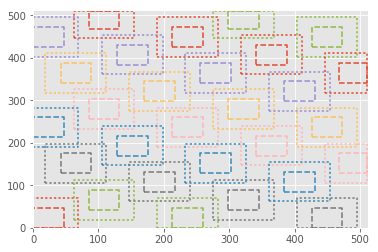

In [6]:
config = ZogyMapReduceConfig()
#config.gridStepX = config.gridStepY = 5
#config.gridSizeX = config.gridSizeY = 7
#config.borderSizeX = config.borderSizeY = 3
config.reducerSubtask.reduceOperation = 'average'
task = dit.ImageMapReduceTask(config=config)
print config
task._generateGrid(exposure, forceEvenSized=True)
task._plotBoxes(exposure.getBBox(), 5)

In [7]:
newExp = task.run(exposure, template=template, forceEvenSized=True).exposure #, variablePsf=testObj.variablePsf)

In [8]:
# Run with constant variance number to compare with single frame (non-gridded) ZOGY from above:
sig1 = np.sqrt(dit.computeClippedImageStats(template.getMaskedImage().getVariance().getArray()).mean)
sig2 = np.sqrt(dit.computeClippedImageStats(exposure.getMaskedImage().getVariance().getArray()).mean)
print sig1, sig2
newExpA = task.run(exposure, template=template, forceEvenSized=True, sigmas=[sig1, sig2]).exposure

17.3708 17.4068


In [9]:
# Run with ZOGY in image space... ugh. Need bigger borders, for sure!

config = ZogyMapReduceConfig()
#config.gridStepX = config.gridStepY = 5
#config.gridSizeX = config.gridSizeY = 7
config.borderSizeX = config.borderSizeY = 3
config.reducerSubtask.reduceOperation = 'average'
task = dit.ImageMapReduceTask(config=config)
print config
#boxes0, boxes1 = task._generateGrid(exposure)

newExpB = task.run(exposure, template=template, sigmas=[sig1, sig2], forceEvenSized=True, inImageSpace=True).exposure

{'gridStepY': 10.0, 'gridStepX': 10.0, 'mapperSubtask': {}, 'gridSizeX': 10.0, 'gridSizeY': 10.0, 'gridCentroidsY': None, 'gridCentroidsX': None, 'reducerSubtask': {'reduceOperation': 'average'}, 'adjustGridOption': 'spacing', 'borderSizeX': 3.0, 'borderSizeY': 3.0, 'scaleByFwhm': True, 'ignoreMaskPlanes': ['INTRP', 'EDGE', 'DETECTED', 'SAT', 'CR', 'BAD', 'NO_DATA', 'DETECTED_NEGATIVE']}


diffimTests/imageMapReduce.py:268: RuntimeWarning: invalid value encountered in true_divide
  newMI.getImage().getArray()[:, :] /= wts
diffimTests/imageMapReduce.py:269: RuntimeWarning: invalid value encountered in true_divide
  newMI.getVariance().getArray()[:, :] /= wts


In [10]:
def ga(exposure):
    return exposure.getMaskedImage().getImage().getArray()
def gv(exposure):
    return exposure.getMaskedImage().getVariance().getArray()
def rb(array, width=5):  # remove border
    shape = array.shape
    return array[width:(shape[0]-width), width:(shape[1]-width)]

stats(mean=2.9980597, stdev=19.104036, min=-74.0, max=4435.0)
stats(mean=-0.066204242, stdev=24.983107, min=-926.10272, max=1053.614)
stats(mean=-0.066174582, stdev=24.984501, min=-926.53729, max=1053.4874)
stats(mean=-0.0066657173, stdev=24.922947, min=-926.53375, max=1053.4873)
stats(mean=1.4098399, stdev=9.3236046, min=-37.60331, max=4495.3071)
stats(mean=-2.1618751762780731e-05, stdev=0.0096216871668549798, min=-812.06615871367956, max=35.676273174767104)
stats(mean=3.2829201038020805e-08, stdev=4.1598235863867754e-05, min=-811.57958644805456, max=35.686734028343764)
stats(mean=-3.1597021995678475e-06, stdev=0.0024913590957255974, min=-0.059008812035779457, max=0.05590775956594296)


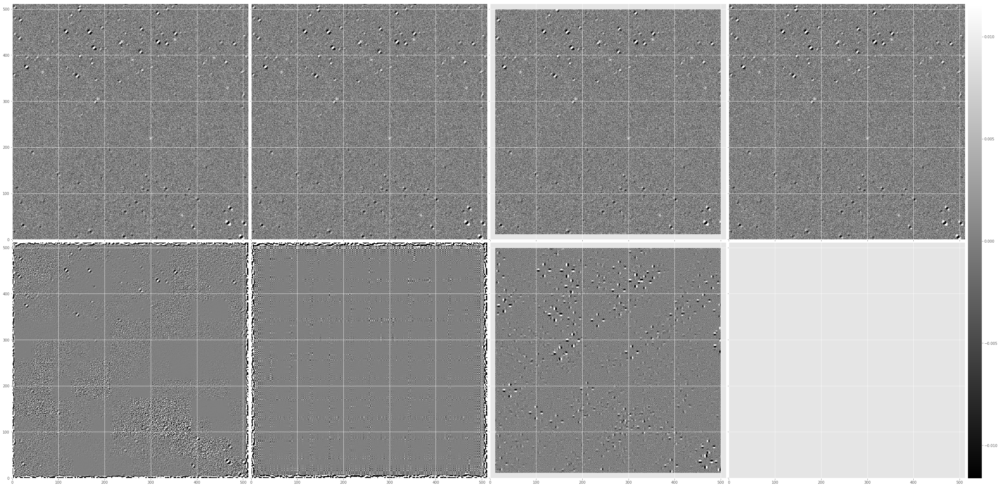

In [11]:
print dit.computeClippedImageStats(ga(exposure))
print dit.computeClippedImageStats(ga(newExp))
print dit.computeClippedImageStats(ga(newExpA))
print dit.computeClippedImageStats(ga(newExpB))
print dit.computeClippedImageStats(ga(exposure)-ga(newExp))
print dit.computeClippedImageStats(ga(newExp) - testObj.D_Zogy.im)
print dit.computeClippedImageStats(ga(newExpA) - testObj.D_Zogy.im)
print dit.computeClippedImageStats(ga(newExpB) - testObj.D_Zogy.im)
dit.plotImageGrid((ga(newExp), ga(newExpA), ga(newExpB), testObj.D_Zogy.im, ga(newExp)-testObj.D_Zogy.im,
                  ga(newExpA)-testObj.D_Zogy.im, ga(newExpB)-testObj.D_Zogy.im), imScale=12)

try with *input* variable Psf

Now for S_corr

In [12]:
# Need even bigger borders, for sure!

config = ZogyMapReduceConfig()
#config.gridStepX = config.gridStepY = 5
#config.gridSizeX = config.gridSizeY = 7
config.borderSizeX = config.borderSizeY = 3
config.reducerSubtask.reduceOperation = 'average'
task = dit.ImageMapReduceTask(config=config)
print config
#boxes0, boxes1 = task._generateGrid(exposure)

newExp       = task.run(exposure, template=template, inImageSpace=False, variablePsf=testObj.variablePsf,
                       Scorr=False, forceEvenSized=True).exposure
newExp_Scorr = task.run(exposure, template=template, inImageSpace=False, variablePsf=testObj.variablePsf,
                       Scorr=True, forceEvenSized=True).exposure

{'gridStepY': 10.0, 'gridStepX': 10.0, 'mapperSubtask': {}, 'gridSizeX': 10.0, 'gridSizeY': 10.0, 'gridCentroidsY': None, 'gridCentroidsX': None, 'reducerSubtask': {'reduceOperation': 'average'}, 'adjustGridOption': 'spacing', 'borderSizeX': 3.0, 'borderSizeY': 3.0, 'scaleByFwhm': True, 'ignoreMaskPlanes': ['INTRP', 'EDGE', 'DETECTED', 'SAT', 'CR', 'BAD', 'NO_DATA', 'DETECTED_NEGATIVE']}


stats(mean=5.9669983e-06, stdev=0.00025333371, min=-0.0022637462, max=0.003316862)
stats(mean=0.0002544793, stdev=1.4730483e-05, min=0.00022747478, max=0.00091613404)
stats(mean=3.1056393014787563e-06, stdev=0.00026775075627154764, min=-0.017524996304398684, max=0.016133159269178528)
stats(mean=0.00025203141787985339, stdev=1.495047637303307e-06, min=0.0002466211009686534, max=0.0012317373972307024)
stats(mean=-9.7761380911167476e-08, stdev=3.2277443002006087e-05, min=-0.014400920235151667, max=0.01838865712981513)


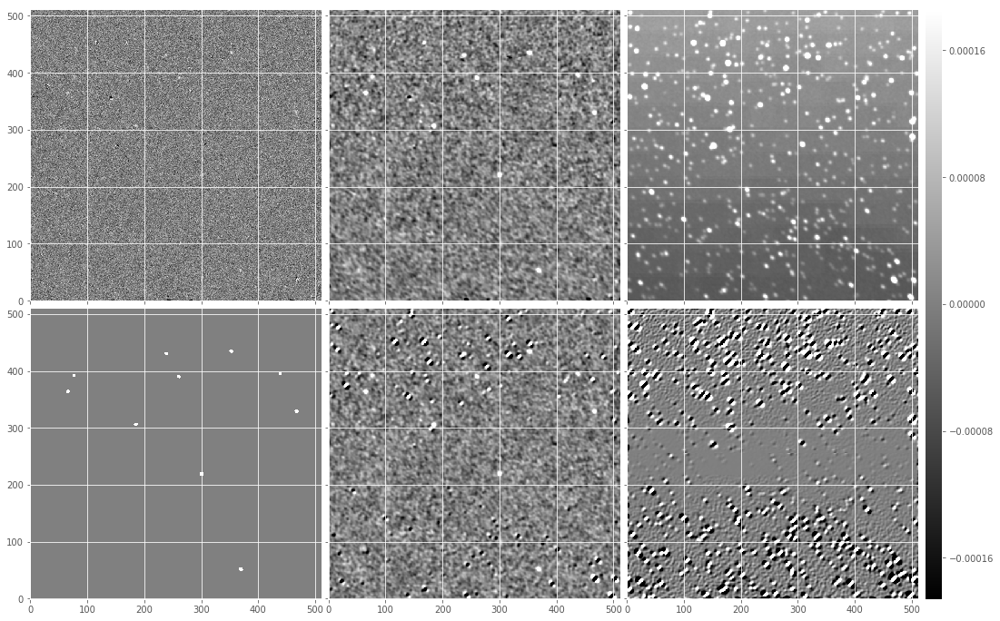

In [13]:
Sim = ga(newExp_Scorr)
Svar = gv(newExp_Scorr)
print dit.computeClippedImageStats(rb(Sim))
print dit.computeClippedImageStats(rb(Svar))
print dit.computeClippedImageStats(testObj.S_Zogy.im)
print dit.computeClippedImageStats(testObj.S_Zogy.var)
print dit.computeClippedImageStats(rb(Sim-testObj.S_Zogy.im))
dit.plotImageGrid((ga(newExp), Sim, Svar, (Sim/Svar > 5.0) * 1.0, testObj.S_Zogy.im, Sim-testObj.S_Zogy.im), imScale=6)

A&L(dec): stats(mean=0.07930059, stdev=24.747385, min=-217.34805, max=220.93216)
Zogy: stats(mean=0.020850452, stdev=24.665621, min=-275.82269, max=194.89211)
A&L(dec) - Zogy: stats(mean=-0.013502076, stdev=2.3310819, min=-92.024117, max=116.29131)
A&L(dec) - A&L: stats(mean=-0.024965078, stdev=6.9027791, min=-60.441925, max=55.486847)
Scorr: stats(mean=4.8686729e-06, stdev=0.00025397938, min=-0.0031090064, max=0.003316862)
Scorr_var: stats(mean=0.00025451393, stdev=1.4936897e-05, min=0.00022747478, max=0.00091613404)


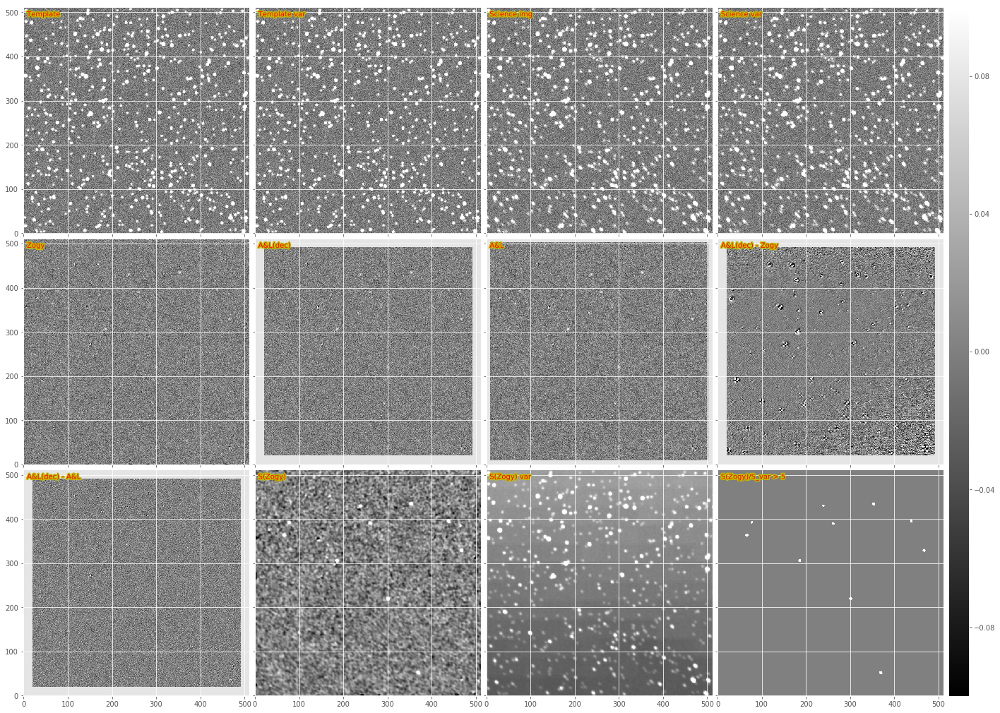

In [14]:
testObj2 = testObj.clone()
testObj2.S_Zogy = dit.Exposure(ga(newExp_Scorr), dit.psf.afwPsfToArray(newExp_Scorr.getPsf()), gv(newExp_Scorr))
testObj2.D_Zogy = dit.Exposure(ga(newExp), dit.psf.afwPsfToArray(newExp.getPsf()), gv(newExp))
testObj2.doPlot(imScale=6, include_Szogy=True);

Time to try measured PSFs again...

In [15]:
import testPsfexPsfEDITED as tpp

exposure2 = testObj.im2.asAfwExposure()
#res = dit.tasks.doMeasurePsf(exposure2) #, psfMeasureConfig=config)
#psf = res.psf
obj = tpp.SpatialModelPsfTestCase() # removed superclass unittest.TestCase
obj.setExposure(exposure2)
obj.setUp()
obj.testPsfexDeterminer()
psf = obj.exposure.getPsf()
exposure2.setPsf(psf)

template2 = testObj.im1.asAfwExposure()
#res = dit.tasks.doMeasurePsf(template2) #, psfMeasureConfig=config)
#psf = res.psf
obj = tpp.SpatialModelPsfTestCase() # removed superclass unittest.TestCase
obj.setExposure(template2)
obj.setUp()
obj.testPsfexDeterminer()
psf = obj.exposure.getPsf()
template2.setPsf(psf)

526
541


(41, 41)
(ixx=3.86907952116, iyy=3.86036442412, ixy=-0.573722304067)


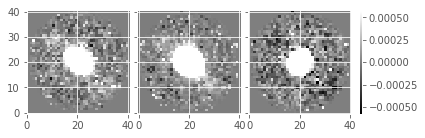

In [23]:
import lsst.afw.geom as afwGeom

# psf1 = psf.computeImage(afwGeom.Point2D(20., 20.)).getArray()
# psf1b = psf1.copy()
# psf1b[psf1b < 0] = 0
# print psf1b[0:10,:].mean(), psf1b[:,0:10].mean(), psf1b[31:41,:].mean(), psf1b[:,31:41].mean()
# psf1b[0:10,:] = psf1b[:,0:10] = psf1b[31:41,:] = psf1b[:,31:41] = 0
# psf1b /= psf1b.sum()

psf = exposure2.getPsf()
print psf.computeImage().getDimensions()
print psf.computeShape()
dit.plotImageGrid((psf.computeImage(afwGeom.Point2D(20., 20.)), 
                   psf.computeImage(afwGeom.Point2D(250., 250.)),
                   psf.computeImage(afwGeom.Point2D(500.,500.))))

(ixx=2.58176935093, iyy=2.59355507833, ixy=0.00107890195603)


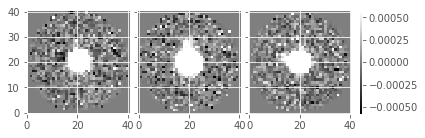

In [24]:
psf = template2.getPsf()
print psf.computeShape()
dit.plotImageGrid((psf.computeImage(afwGeom.Point2D(20., 20.)),
                   psf.computeImage(afwGeom.Point2D(250., 250.)),
                   psf.computeImage(afwGeom.Point2D(500.,500.))))

{'gridStepY': 9.0, 'gridStepX': 9.0, 'mapperSubtask': {}, 'gridSizeX': 10.0, 'gridSizeY': 10.0, 'gridCentroidsY': None, 'gridCentroidsX': None, 'reducerSubtask': {'reduceOperation': 'average'}, 'adjustGridOption': 'spacing', 'borderSizeX': 3.0, 'borderSizeY': 3.0, 'scaleByFwhm': True, 'ignoreMaskPlanes': ['INTRP', 'EDGE', 'DETECTED', 'SAT', 'CR', 'BAD', 'NO_DATA', 'DETECTED_NEGATIVE']}


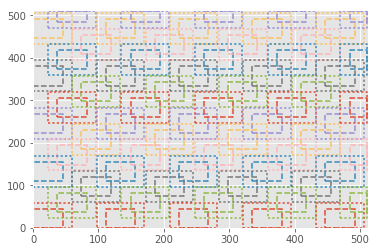

In [18]:
config = ZogyMapReduceConfig()
config.gridStepX = config.gridStepY = 9
#config.gridSizeX = config.gridSizeY = 10
config.borderSizeX = config.borderSizeY = 3
config.reducerSubtask.reduceOperation = 'average'
task = dit.ImageMapReduceTask(config=config)
print config

newExp2 = task.run(exposure2, template=template2, inImageSpace=False,
                       Scorr=False, forceEvenSized=True).exposure
newExp2_Scorr = task.run(exposure2, template=template2, inImageSpace=False,
                       Scorr=True, forceEvenSized=True).exposure
task._plotBoxes(exposure2.getBBox())

A&L(dec): stats(mean=0.07930059, stdev=24.747385, min=-217.34805, max=220.93216)
Zogy: stats(mean=0.060973387, stdev=24.732941, min=-861.65442, max=290.10815)
A&L(dec) - Zogy: stats(mean=0.027389579, stdev=28.205008, min=-240.69003, max=196.90656)
A&L(dec) - A&L: stats(mean=-0.024965078, stdev=6.9027791, min=-60.441925, max=55.486847)
Scorr: stats(mean=3.7039767e-06, stdev=0.00024940146, min=-0.0042065806, max=0.014322788)
Scorr_var: stats(mean=0.0002474669, stdev=1.5483061e-05, min=0.00021549132, max=0.00089692953)


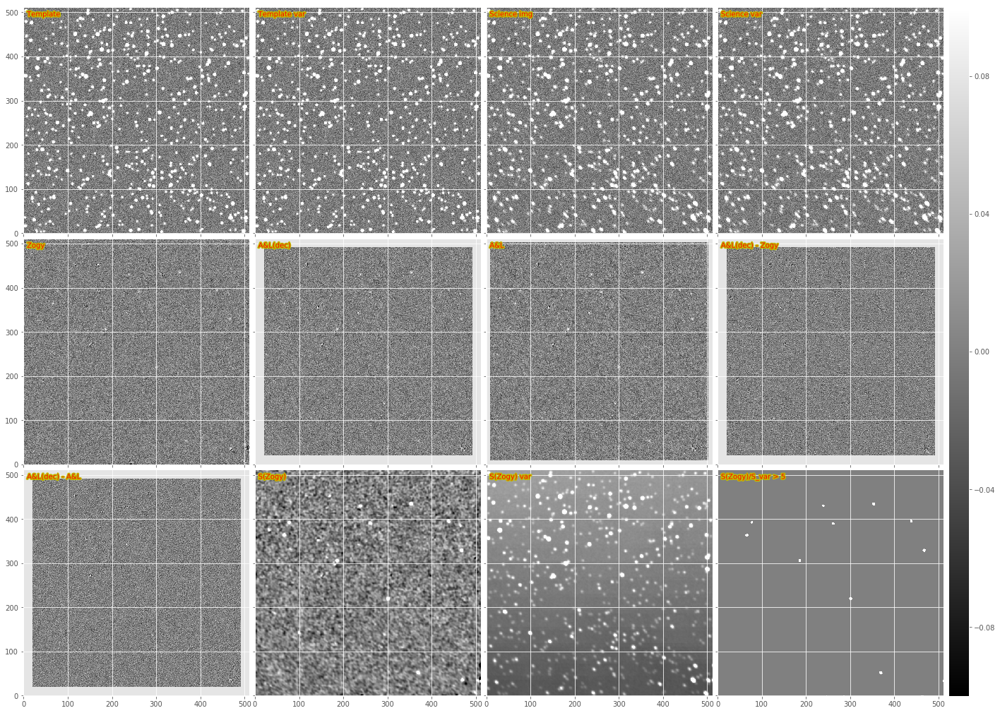

In [19]:
#print dit.computeClippedImageStats(ga(exposure2))
#print dit.computeClippedImageStats(ga(newExp))
#print dit.computeClippedImageStats(ga(newExp2))
#print dit.computeClippedImageStats(ga(exposure2)-ga(newExp2))
#print dit.computeClippedImageStats(ga(newExp) - testObj.D_Zogy.im)
#print dit.computeClippedImageStats(ga(newExp2) - testObj.D_Zogy.im)
#print dit.computeClippedImageStats(ga(newExp) - ga(newExp2))
#dit.plotImageGrid((ga(newExp2), ga(newExp), testObj.S_Zogy.im,
#                  ga(newExp2) - testObj.S_Zogy.im), imScale=12)
testObj2 = testObj.clone()
testObj2.D_Zogy = dit.Exposure(ga(newExp2), dit.psf.afwPsfToArray(newExp2.getPsf()), gv(newExp2))
testObj2.S_Zogy = dit.Exposure(ga(newExp2_Scorr), dit.psf.afwPsfToArray(newExp2_Scorr.getPsf()), gv(newExp2_Scorr))
testObj2.doPlot(imScale=6, include_Szogy=True);

In [20]:
testObj2.runTest()

{'ALstack': {'FN': 0, 'FP': 5, 'TP': 10},
 'ALstack_decorr': {'FN': 1, 'FP': 1, 'TP': 9},
 'SZogy': {'FN': 0, 'FP': 0, 'TP': 10},
 'Zogy': {'FN': 0, 'FP': 1, 'TP': 10}}

In [21]:
# for comparison, without using a spatially-varying PSF:
testObj.runTest()

{'ALstack': {'FN': 0, 'FP': 5, 'TP': 10},
 'ALstack_decorr': {'FN': 1, 'FP': 1, 'TP': 9},
 'SZogy': {'FN': 0, 'FP': 30, 'TP': 10},
 'Zogy': {'FN': 3, 'FP': 38, 'TP': 7}}

In [22]:
# let's add the one where I used the *input* but variable PSF
testObj3 = testObj.clone()
testObj3.D_Zogy = dit.Exposure(ga(newExp), testObj.D_Zogy.psf, newExp.getMaskedImage().getVariance().getArray())
testObj3.S_Zogy = dit.Exposure(ga(newExp_Scorr), dit.psf.afwPsfToArray(newExp_Scorr.getPsf()), gv(newExp_Scorr))
testObj3.runTest()

{'ALstack': {'FN': 0, 'FP': 5, 'TP': 10},
 'ALstack_decorr': {'FN': 1, 'FP': 1, 'TP': 9},
 'SZogy': {'FN': 0, 'FP': 0, 'TP': 10},
 'Zogy': {'FN': 1, 'FP': 1, 'TP': 9}}